In [1]:
import matplotlib.pyplot as plt
import wntr
import wntr.network.controls as controls
import sqlite3
import csv
import time
import pandas as pd
import glob
import warnings
warnings.filterwarnings('ignore')

In [16]:
def plot_var(tags, data, a_label):
    for var in (tags):
        plt.figure(figsize=(16, 2))    
        plt.plot(data[var], label=a_label)          
        plt.legend()
        plt.grid(True)
        plt.title(var)
        plt.show()    

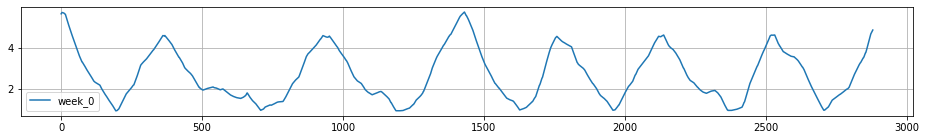

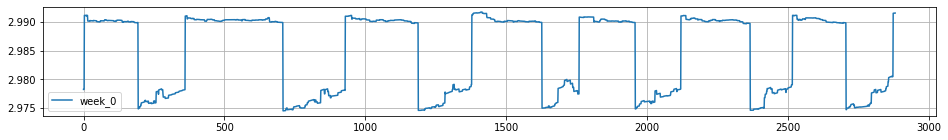

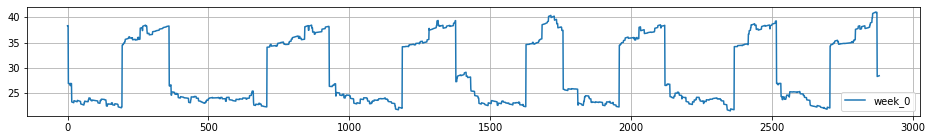

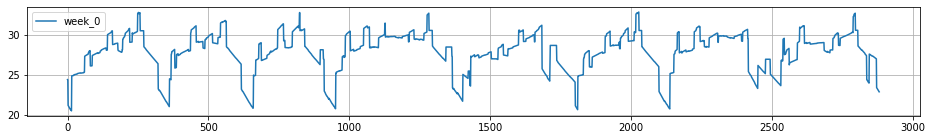

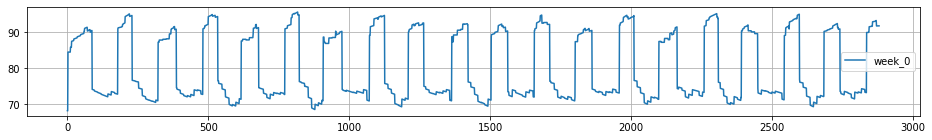

...

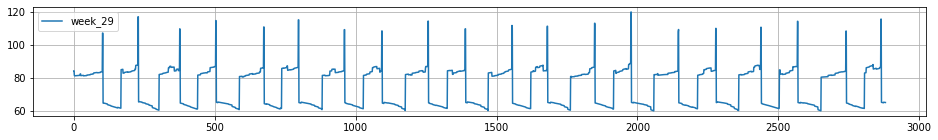

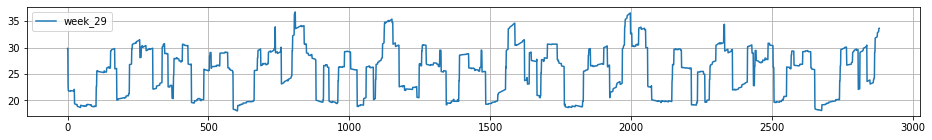

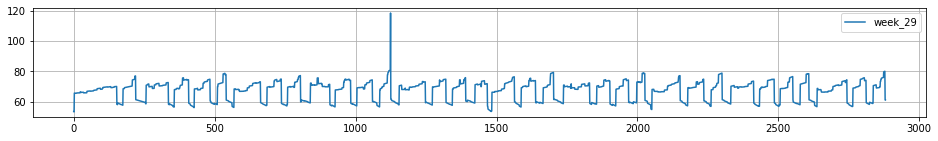

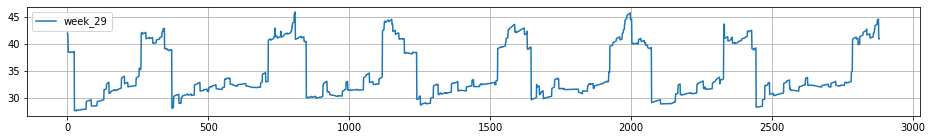

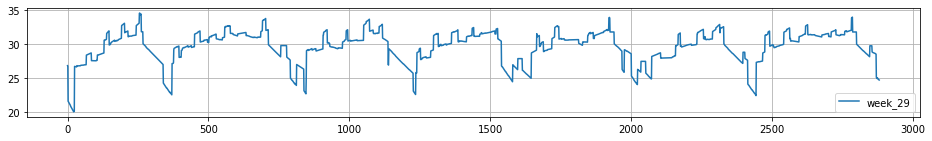

FileNotFoundError: [Errno 2] File b'2021_data/30_week_simulation/week_3/physical_process.csv' does not exist: b'2021_data/30_week_simulation/week_3/physical_process.csv'

In [3]:
class color:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'   

folder_in = '2021_data/30_week_simulation'
folder_out = '2021_data/work-copy_30_week_simulation'
filename = 'physical_process.csv'
file_expr = folder_in + '/*'
paths = glob.glob(file_expr)
directories = []
for path in paths:    
    directories.append(path.split('\\')[1])        

sim_weeks = 1
var_cat_noncat =['J306_LEVEL', 'J317_LEVEL']
tanks = ['T1_LEVEL', 'T2_LEVEL', 'T3_LEVEL', 'T4_LEVEL', 'T5_LEVEL', 'T6_LEVEL', 'T7_LEVEL']
joints = ['J280_LEVEL', 'J269_LEVEL', 'J300_LEVEL', 'J256_LEVEL', 'J289_LEVEL', 'J415_LEVEL',
          'J302_LEVEL', 'J306_LEVEL', 'J307_LEVEL', 'J317_LEVEL', 'J14_LEVEL', 'J422_LEVEL']

trouble_joints = ['J306_LEVEL', 'J307_LEVEL']

for week in directories:
    # Data frame creation                    
    week_data = pd.read_csv(folder_in + '/' + week +'/' + filename)
    var_all = list(week_data.head(0))    
    
    # Junctions J306 and J317 with 1 minute hydraulic timestep
    plot_var(['T1_LEVEL'], week_data, week)
    plot_var(joints, week_data, week)

In [4]:
week_0 = pd.read_csv(folder_in + '/' + 'week_0' +'/' + filename)

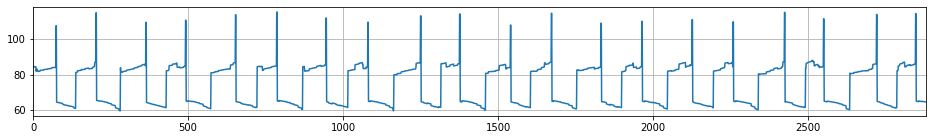

In [5]:
plt.figure(figsize=(16, 2))    
week_0['J306_LEVEL'].plot()
plt.grid(True)

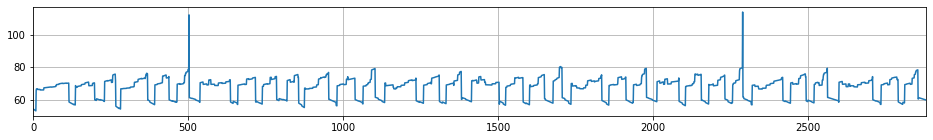

In [6]:
plt.figure(figsize=(16, 2))    
week_0['J317_LEVEL'].plot()
plt.grid(True)

In [7]:
len(week_0['J306_LEVEL'][week_0['J306_LEVEL'] > 90])

40

In [8]:
len(week_0['J306_LEVEL'][week_0['J306_LEVEL'] < 90])

2841

In [9]:
len(week_0['J306_LEVEL'])

2881

In [10]:
week_0 = week_0[week_0['J306_LEVEL'] < 90]

In [11]:
len(week_0['J306_LEVEL'][week_0['J306_LEVEL'] > 90])

0

In [12]:
len(week_0['J317_LEVEL'][week_0['J317_LEVEL'] > 90])

2

In [13]:
# Clean for J_306 LEVEL
for week in directories:
    # Read original physical process variable
    week_data = pd.read_csv(folder_in + '/' + week +'/' + filename)
    
    # Apply conditional to clean
    week_data = week_data[week_data['J306_LEVEL'] < 90]
    week_data = week_data[week_data['J317_LEVEL'] < 90]
    
    # Save cleaned value
    week_data.to_csv(folder_out + '/' + week +'/' + filename)

FileNotFoundError: [Errno 2] File b'2021_data/30_week_simulation/week_3/physical_process.csv' does not exist: b'2021_data/30_week_simulation/week_3/physical_process.csv'

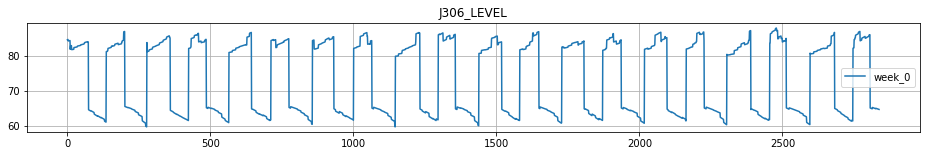

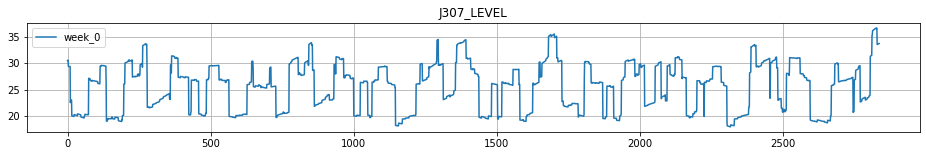

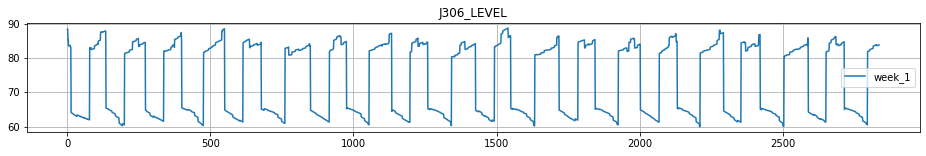

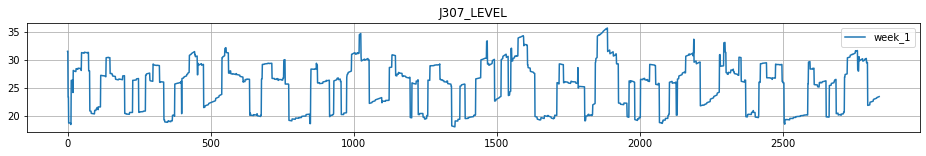

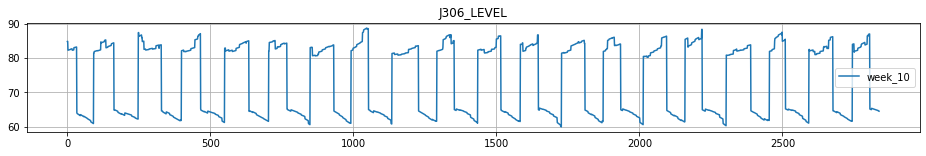

...

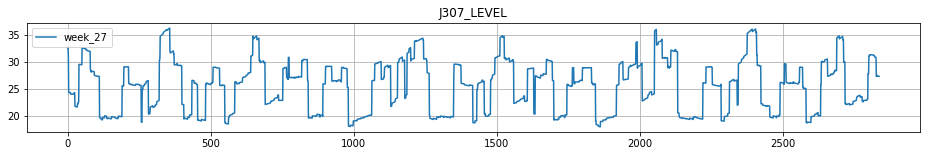

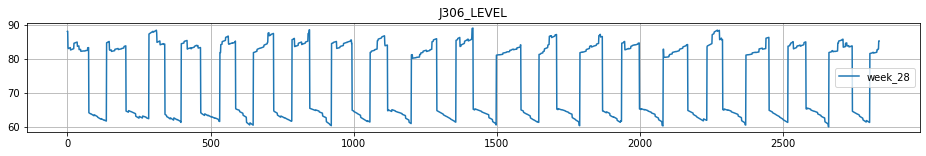

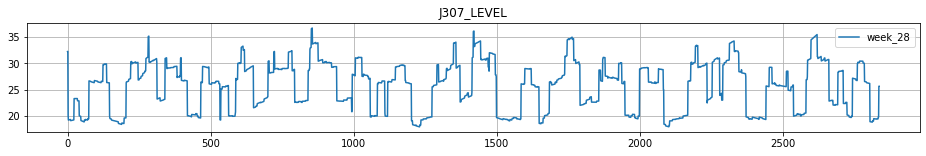

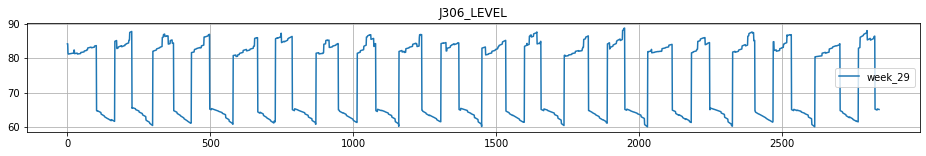

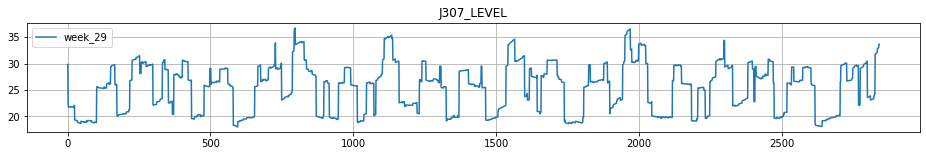

FileNotFoundError: [Errno 2] File b'2021_data/work-copy_30_week_simulation/week_3/physical_process.csv' does not exist: b'2021_data/work-copy_30_week_simulation/week_3/physical_process.csv'

In [17]:
# Plot the clear files
trouble_joints = ['J306_LEVEL', 'J307_LEVEL']
for week in directories:
    week_data = pd.read_csv(folder_out + '/' + week +'/' + filename)   
    var_all = list(week_data.head(0))
        
    # Junctions J306 and J317 with 1 minute hydraulic timestep    
    plot_var(trouble_joints, week_data, week)    